In [2]:
using DifferentialEquations, Plots, PyPlot

The Julia DifferentialEquations package works in 3 steps: 1) define the differentialequation function(delta,current,otherparameters,t) 2) define an ODEproblem(diffeqfunction,timespan,otherparams)     2) solve(problem)

In [3]:
function inoue2016(delta_bcr,bcr,p,t)
    #signal section#
    if p[1]==true
        ADSR, attack, decay, sustain, release, suslength, maxamplitude=p
    end
    global PHASE
    global DOSE
    global MUTATIONMODS
    global xlate

    signal=originalsignal_nolate(t, xlate)
    if PHASE == 2 && p[1] == true
            signal=envelope2(t,attack, decay, sustain, release, suslength, maxamplitude)
    end
    ###############
    bcr_params=zeros(116,1)
    bcr_flux=zeros(81,1)
    bcr_default_params=[1.00E-04 , #=kCp0    1=#
    1.00E-04 , #=kCpB0    2=#
    1.00E-04 , #=kCpM0    3=#
    1.00E-04 , #=kCpBM0   4=#
    7.00E+00 , #=kCpS     5=#
    2.00E+01 , #=kCpBS    6=#
    1.70E+01 , #=kCpMS    7=#
    1.00E+00 , #=kCpBMS	8=#
    1.00E+00 , #=kmCpS	9=#
    1.00E+00 , #=kmCpBS	10=#
    1.00E+00 , #=kmCpMS	11=#
    5.00E+00 , #=kmCpBMS	12=#
    7.50E-01 , #=kCpu	    13=#
    1.95E+00 , #=kCpBu	14=#
    3.75E+00 , #=kCpMu	15=#
    2.50E-01 , #=kCpBMu	16=#
    1.00E+00 , #=kmCpu	17=#
    0 ,        #=oops     18=#
    1.00E+00 , #=kmCpBu	19=#
    1.00E+00 , #=kmCpMu	20=#
    2.50E+00 , #=kmCpBMu	21=#
    5.00E-01 , #=kBaM     22=#
    5.00E-01 , #=kCaB	    23=#
    5.00E-01 , #=kCaM	    24=#
    1.50E+00 , #=kCBaM	25=#
    5.00E-01 , #=kCMaB	26=#
    5.00E-01 , #=kCaBM	27=#
    1.89E+00 , #=kCpaBM	28=#
    7.89E+00 , #=kCpaB	29=#
    4.59E+00 , #=kCpaM	30=#
    2.50E+00 , #=kCpBaM	31=#
    1.50E+00 , #=kCpMaB	32=#
    2.50E+00 , #=kBdM	    33=#
    1.00E+00 , #=kCdB	    34=#
    2.50E+00 , #=kCdM 	35=#
    1.50E+00 , #=kCBdM	36=#
    2.50E+00 , #=kCMdB	37=#
    3.00E-01 , #=kCpdB	38=#
    3.00E-01 , #=kCpdM	39=#
    1.50E-01 , #=kCpBdM	40=#
    4.50E-01 , #=kCpMdB	41=#
    2.00E-01 , #=kCdBM	42=#
    2.50E-01 , #=kCpdBM	43=#
    2.70E-01 , #=kTp0 	44=#
    3.20E-01 , #=kCTpS	45=#
    1.32E+00 , #=kCBTpS	46=#
    1.32E+00 , #=kCMTpS	47=#
    1.32E+00 , #=kCBMTpS	48=#
    2.10E+00 , #=kmCTpS	49=#
    2.10E+00 , #=kmCBTpS	50=#
    2.10E+00 , #=kmCMTpS	51=#
    2.10E+00 , #=kmCBMTpS 52=#
    1.67E+01 , #=kTpIKK1	53=#
    7.80E-01 , #=kmTpIKK1 54=#
    3.40E+00 , #=kTpu	    55=#
    1.79E+00 , #=kmTpu	56=#
    3.30E-01 , #=kTpC0	57=#
    5.50E+00 , #=kCTpCS	58=#
    1.75E+01 , #=kCBTpCS	59=#
    1.65E+01 , #=kCMTpCS	60=#
    2.45E+01 , #=kCBMTpCS 61=#
    5.20E-01 , #=kmCTpCS	62=#
    5.20E-01 , #=kmCBTpCS 63=#
    5.20E-01 , #=kmCMTpCS 64=#
    5.20E-01 , #=kmCBMTpCS65=#
    1.00E+01 , #=kTpCIKK1 66=#
    7.80E-01 , #=kmTpCIKK167=#
    1.71E+01 , #=kTpCIKK2 68=#
    1.30E-01 , #=kmTpCIKK269=#
    8.00E+01 , #=kTpCIKK3 70=#
    7.00E-01 , #=kmTpCIKK371=#
    1.53E+01 , #=kTpCu    72=#
    8.00E-01 , #=kmTpCu	73=#
    1.79E+02 , #=kTaB	    74=#
    1.69E+02 , #=kTaM	    75=#
    3.69E+02 , #=kTaBM	76=#
    3.79E+00 , #=kTpaB	77=#
    3.79E+00 , #=kTpaM	78=#
    3.79E+00 , #=kTpaBM	79=#
    4.00E+02 , #=kTCd	    80=#
    3.21E+00 , #=kTpCd	81=#
    5.50E-02 , #=kIp0	    82=#
    1.93E+00 , #=kIpTAKp	83=#
    4.00E-01 , #=kmIpTAKp 84=#
    3.80E+00 , #=kIpTAKpC 85=#
    5.80E-01 , #=kmIpTAKpC86=#
    1.50E+01 , #=kIpu	    87=#
    6.70E-01 , #=kmIpu	88=#
    5.10E-02 , #=kICp0	89=#
    8.64E+00 , #=kICpTAKp 90=#
    7.10E+00 , #=kmICpTAKp91=#
    1.23E+01 , #=kICpTAKpC92=#
    7.18E+00 , #=kmICpTAKpC93=#
    1.25E+01 , #=kIpCu	94=#
    5.41E+00 , #=kmIpCu	95=#
    3.03E+01 , #=kIaB	    96=#
    2.23E+01 , #=kIaM	    97=#
    5.03E+01 , #=kIaBM	98=#
    3.13E+01 , #=kIpaB	99=#
    2.33E+01 , #=kIpaM	100=#
    6.03E+01 , #=kIpaBM	101=#
    3.28E+01 , #=kICd	    102=#
    1.32E+00 , #=kIpCd	103=#
    1.00E-05 , #=kIpCfaIKKpC	104=#
    2.56E+00 , #=kmIpCfaIKKpC	105=#
    1.09E+02 , #=kIpCfaIKKppC	106=#
    2.01E+00 , #=kmIpCfaIKKppC	107=#
    1.53E+00 , #=kIppCu	108=#
    2.00E-01 , #=kmIppCu	109=#
    4.50E-01 , #=kIppCd	110=#
    1.00E-01 , #=kIppChf	111=#
    5.00E-01 , #=kmIppChf	112=#
    9.00E-03 , #=kIpphf	113=#
    1.52E+00 , #=kmIpphf	114=#
    1.44E+00 , #=kIir	    115=#
    3.44E+00]  #=kmIir	116=#
    bcr_params=bcr_default_params.*MUTATIONMODS

    #kCp0 * C	basal C phosphorylation	C => Cp
    bcr_flux[1] = bcr_params[1] * bcr[4];
    #kCpS * signal * C / (kmCpS + C)	signal-dependent C phosphorylation	signal -0 C => Cp
    bcr_flux[2] = (bcr_params[5] * signal * bcr[4])/(bcr_params[9] + bcr[4]);
    #kCpu * Cp / (kmCpu + Cp)	Cp dephosphorylation	Cp => C
    bcr_flux[3] = (bcr_params[13] * bcr[7]) / (bcr_params[17]+bcr[7]);
    #kCpB0 * CB	basal CB phosphorylation	CB => CpB
    bcr_flux[4] = bcr_params[2]* bcr[5];
    #kCpBS * signal * CB / (kmCpBS + CB)	signal-dependent CB phosphorylation	signal -0 CB => CpB
    bcr_flux[5] = (bcr_params[6] * signal * bcr[5]) / (bcr_params[10] + bcr[5]);
    #kCpBu * CpB / (kmCpBu + CpB)	CpB dephosphorylation	CpB => CB
    bcr_flux[6]= (bcr_params[14] * bcr[8]) / (bcr_params[19] + bcr[8]);
    #kCpM0 * CM	basal CM phosphorylation	CM => CpM
    bcr_flux[7] = bcr_params[3]* bcr[6];
    #CpMS * signal * CM / (kmCpMS + CM)	signal-dependent CM phosphorylation	signal -0 CM => CpM
    bcr_flux[8] = (bcr_params[7] * signal * bcr[6])/ (bcr_params[11]+bcr[6]);
    #CpMu * CpM / (kmCpMu + CpM)	CpM dephosphorylation	CpM => CM
    bcr_flux[9] = (bcr_params[15] * bcr[9])/(bcr_params[20]+bcr[9]);
    #kCpBM0 * CBM	basal CBM phosphorylation	CBM => CpBM
    bcr_flux[10] = bcr_params[4]*bcr[10];
    #kCpBMS * signal * CBM / (kmCpBMS + CBM)	signal-dependent CBM phosphorylation	signal -0 CBM => CpBM
    bcr_flux[11] = (bcr_params[8] * signal * bcr[10])/(bcr_params[12]+bcr[10]);
    #kCpBMu * CpBM / (kmCpBMu + CpBM)	CpBM dephosphorylation	CpBM => CBM
    bcr_flux[12] = (bcr_params[16] * bcr[11])/(bcr_params[21]+bcr[11]);
    #kBaM * B * M	association between B and M	B + M => BM
    bcr_flux[13] = bcr_params[22] * bcr[1] * bcr[2];
    #kBdM * BM	dissociation between B and M	BM => B + M
    bcr_flux[14] = bcr_params[33] * bcr[3];
    #kCaB * C * B	association between C and B	C + B => CB
    bcr_flux[15] = bcr_params[23] * bcr[4] * bcr[1];
    #kCdB * CB	dissociation between C and B	CB => C + B
    bcr_flux[16] = bcr_params[34] * bcr[5];
    #kCpaB * Cp * B	association between Cp and B	Cp + B => CpB
    bcr_flux[17] = bcr_params[29] * bcr[7] * bcr[1]; #arran kb28 is used but kb29 is expected, investigate difference made.
    #kCpdB * CpB	dissociation between Cp and B	CpB => Cp + B
    bcr_flux[18] =bcr_params[38] * bcr[8];
    #kCaM * C * M	association between C and M	C + M => CM
    bcr_flux[19] =  bcr_params[24] * bcr[4] * bcr[2];
    #kCdM * CM	dissociation between C and M	CM => C + M
    bcr_flux[20] = bcr_params[35] * bcr[6];
    #kCpaM * Cp * M	association between Cp and M	Cp + M => CpM
    bcr_flux[21]  = bcr_params[30] * bcr[7] * bcr[2];
    #kCpdM * CpM	dissociation between Cp and M	CpM => Cp + M
    bcr_flux[22] = bcr_params[39] * bcr[9];
    #kCBaM * CB * M	association between CB and M	CB + M => CBM
    bcr_flux[23] = bcr_params[25] * bcr[5] * bcr[2];
    #kCBdM * CBM	dissociation between CB and M	CBM => CB + M
    bcr_flux[24] = bcr_params[36] * bcr[10];
    #kCpBaM * CpB * M	association between CpB and M	CpB + M => CpBM
    bcr_flux[25] = bcr_params[31] * bcr[8] * bcr[2];
    #kCpBdM * CpBM	dissociation between CpB and M	CpBM => CpB + M
    bcr_flux[26] = bcr_params[40] * bcr[11];
    #kCMaB * CM * B	association between CM and B	CM + B => CBM
    bcr_flux[27] = bcr_params[26] * bcr[6] * bcr[1];
    #kCMdB * CBM	dissociation between CM and B	CBM => CM + B
    bcr_flux[28] = bcr_params[37] * bcr[10];
    #kCpMaB * CpM * B	association between CpM and B	CpM + B => CpBM
    bcr_flux[29] = bcr_params[32] * bcr[9] * bcr[1];
    #kCpMdB * CpBM	dissociation between CpM and B	CpBM => CpM + B
    bcr_flux[30] = bcr_params[41] * bcr[11];
    #kCaBM * C * BM	association between C and BM	C + BM => CBM
    bcr_flux[31] = bcr_params[27] * bcr[4] * bcr[3];
    #kCdBM * CBM	dissociation between C and BM	CBM => C + BM
    bcr_flux[32] = bcr_params[42] * bcr[10];
    #kCpaBM * Cp * BM	association between Cp and BM	Cp + BM => CpBM
    bcr_flux[33] = bcr_params[28] * bcr[7] * bcr[3];
    #kCpdBM * CpBM	dissociation between Cp and BM	CpBM => Cp + BM
    bcr_flux[34] = bcr_params[43] * bcr[11];
    #kTp0 * TAK1	basal TAK1 phosphorylation	TAK1 => TAK1p
    bcr_flux[35] = bcr_params[44] * bcr[12];
    #kCTpS * Cp * TAK1 / (kmCTpS + TAK1)	Cp-dependent TAK1 phosphorylation	Cp -0 TAK1 => TAK1p
    bcr_flux[36] = (bcr_params[45] * bcr[7] * bcr[12])/(bcr_params[49] + bcr[12]);
    #kCBTpS * CpB * TAK1 / (kmCBTpS + TAK1)	CpB-dependent TAK1 phosphorylation	CpB -0 TAK1 => TAK1p
    bcr_flux[37] = (bcr_params[46] * bcr[11] * bcr[12])/(bcr_params[50] + bcr[12]);
    #kCMTpS * CpM * TAK1 / (kmCMTpS + TAK1)	CpM-dependent TAK1 phosphorylation	CpM -0 TAK1 => TAK1p
    bcr_flux[38] = (bcr_params[47] * bcr[9] * bcr[12])/(bcr_params[51]+bcr[12]);
    #kCBMTpS * CpBM * TAK1 / (kmCBMTpS + TAK1)	CpBM-dependent TAK1 phosphorylation	CpBM -0 TAK1 => TAK1p
    bcr_flux[39] = (bcr_params[48] * bcr[11] * bcr[12])/(bcr_params[52] + bcr[12]);
    #kTpIKK1 * IKKp * TAK1 / (kmTpIKK1 + TAK1)	IKKp-dependent TAK1 phosphorylation	IKKp -0 TAK1 => TAK1p
    bcr_flux[40] = (bcr_params[53] * bcr[18] * bcr[12])/(bcr_params[54]+bcr[12]);
    #kTpu * TAK1p / (kmTpu + TAK1p)	basal TAK1 dephosphorylation	TAK1p => TAK1
    bcr_flux[41] = (bcr_params[55] * bcr[14])/(bcr_params[56] + bcr[14]);
    #kTpC0 * TAK1C	basal TAK1C phosphorylation	TAK1C => TAK1pC
    bcr_flux[42] = bcr_params[57] * bcr[13];
    #kCTpCS * Cp * TAK1C / (kmCTpCS + TAK1C)	Cp-dependent TAK1C phosphorylation	Cp -0 TAK1C => TAK1pC
    bcr_flux[43] = (bcr_params[58] * bcr[7] * bcr[13])/(bcr_params[62] + bcr[13]);
    #kCBTpCS * CpB * TAK1C / (kmCBTpCS + TAK1C)	CpB-dependent TAK1C phosphorylation	CpB -0 TAK1C => TAK1pC
    bcr_flux[44] = (bcr_params[59] * bcr[11] * bcr[13])/(bcr_params[63] + bcr[13]);
    #kCMTpCS * CpM * TAK1C / (kmCMTpCS + TAK1C)	CpM-dependent TAK1C phosphorylation	CpM -0 TAK1C => TAK1pC
    bcr_flux[45] = (bcr_params[60] * bcr[9] * bcr[13])/(bcr_params[64] + bcr[13]);
    #kCBMTpCS * CpBM * TAK1C / (kmCBMTpCS + TAK1C)	CpBM-dependent TAK1C phosphorylation	CpBM -0 TAK1C => TAK1pC
    bcr_flux[46] = (bcr_params[61] * bcr[11] * bcr[13])/(bcr_params[65]+bcr[13]);
    #kTpCIKK1 * IKKp * TAK1C / (kmTpCIKK1 + TAK1C)	IKKp-dependent TAK1C phosphorylation	IKKp -0 TAK1C => TAK1pC
    bcr_flux[47] = (bcr_params[66]*bcr[18]*bcr[13])/(bcr_params[67]+bcr[13]);
    #kTpCIKK2 * IKKpC * TAK1C / (kmTpCIKK2 + TAK1C)	IKKpC-dependent TAK1C phosphorylation	IKKpC -0 TAK1C => TAK1pC
    bcr_flux[48] = (bcr_params[68]*bcr[19]*bcr[13])/(bcr_params[69]+bcr[13]);
    #kTpCIKK3 * IKKppC * TAK1C / (kmTpCIKK3 + TAK1C)	IKKppC-dependent TAK1C phosphorylation	IKKppC -0 TAK1C => TAK1pC
    bcr_flux[49] = (bcr_params[70]*bcr[20]*bcr[13])/(bcr_params[71]+bcr[13]);
    #kTpCu * TAK1pC / (kmTpCu + TAK1pC)	basal TAK1pC dephosphorylation	TAK1pC => TAK1C
    bcr_flux[50] = (bcr_params[72]*bcr[15])/(bcr_params[73]+bcr[15]);
    #(kTaB*(CB + CpB)) * TAK1	association between CB and TAK1	CB -0 TAK1 => TAK1C
    bcr_flux[51] = bcr_params[74] * (bcr[5] + bcr[8]) * bcr[12];
    #(kTaM*(CM + CpM)) * TAK1	association between CM and TAK1	CM -0 TAK1 => TAK1C
    bcr_flux[52] = bcr_params[75] * (bcr[6] + bcr[9])* bcr[12];
    #(kTaBM*(CBM + CpBM)) * TAK1	association between CBM and TAK1	CBM -0 TAK1 => TAK1C
    bcr_flux[53] = bcr_params[76]*(bcr[10]+bcr[11])*bcr[12];
    #kTCd * TAK1C	dissociation between CBM and TAK1	TAK1C => TAK1
    bcr_flux[54] = bcr_params[80] * bcr[13];
    #(kTpaB*(CB + CpB)) * TAK1p	association between CB and TAK1p	CB -0 TAK1p => TAK1pC
    bcr_flux[55] = bcr_params[77] * (bcr[5] + bcr[8]) * bcr[14];
    #(kTpaM*(CM + CpM)) * TAK1p	association between CM and TAK1p	CM -0 TAK1p => TAK1pC
    bcr_flux[56] = bcr_params[78]*(bcr[6]+bcr[9])*bcr[14];
    #(kTpaBM*(CBM + CpBM)) * TAK1p	association between CBM and TAK1p	CBM -0 TAK1p => TAK1pC
    bcr_flux[57] = bcr_params[79] * (bcr[10]+bcr[11]) *bcr[14];
    #kTpCd * TAK1pC	dissociation between CBM and TAK1p	TAK1pC => TAK1p
    bcr_flux[58] = bcr_params[81]*bcr[15];
    #kIp0 * IKK	basal IKK phosphorylation	IKK => IKKp
    bcr_flux[59] = bcr_params[82] * bcr[16];
    #kIpTAKp * TAK1p * IKK / (kmIpTAKp + IKK)	TAKp-dependent IKK phosphorylation	TAK1p -0 IKK => IKKp
    bcr_flux[60] = (bcr_params[83] * bcr[14] *bcr[16])/(bcr_params[84]+bcr[16]);
    #kIpTAKpC * TAK1pC * IKK / (kmIpTAKpC + IKK)	TAKpC-dependent IKK phosphorylation	TAK1pC -0 IKK => IKKp
    bcr_flux[61] = (bcr_params[85] * bcr[15] * bcr[16])/(bcr_params[86] + bcr[16]);
    #kICp0 * IKKC	basal IKKC phosphorylation	IKKC => IKKpC
    bcr_flux[62] = bcr_params[89] * bcr[17];
    #kICpTAKp * TAK1p * IKKC / (kmICpTAKp + IKKC)	TAKp-dependent IKKC phosphorylation	TAK1p -0 IKKC => IKKpC
    bcr_flux[63] = (bcr_params[90] * bcr[14] * bcr[17] )/(bcr_params[91] + bcr[17]);
    #kICpTAKpC * TAK1pC * IKKC / (kmICpTAKpC + IKKC)	TAKpC-dependent IKKC phosphorylation	TAK1pC -0 IKKC => IKKpC
    bcr_flux[64] = (bcr_params[92] * bcr[15] * bcr[17])/ (bcr_params[93] + bcr[17]);
    #kIpu * IKKp / (kmIpu + IKKp)	IKKp dephosphorylation	IKKp => IKK
    bcr_flux[65] = bcr_params[87] * bcr[18] / (bcr_params[88] + bcr[18]);
    #kIpCu * IKKpC / (kmIpCu + IKKpC)	IKKpC dephosphorylation	IKKpC => IKKC
    bcr_flux[66] = (bcr_params[94] * bcr[19])/(bcr_params[95]+bcr[19]);
    #(kIaB*(CB + CpB)) * IKK	association between CB and IKK	CB -0 IKK => IKKC
    bcr_flux[67] = bcr_params[96]*(bcr[5]+bcr[8])*bcr[16];
    #(kIaM*(CM + CpM)) * IKK	association between CM and IKK	CM -0 IKK => IKKC
    bcr_flux[68] = bcr_params[97]*(bcr[6]+bcr[9])*bcr[16];
    #(kIaBM*(CBM + CpBM)) * IKK	association between CBM and IKK	CBM -0 IKK => IKKC
    bcr_flux[69] = bcr_params[98] * (bcr[10]+bcr[11])*bcr[16];
    #kICd * IKKC	dissociation between CBM and IKK	IKKC => IKK
    bcr_flux[70] = bcr_params[102] * bcr[17];
    #(kIpaB*(CB + CpB)) * IKKp	association between CB and IKKp	CB -0 IKKp => IKKpC
    bcr_flux[71] = bcr_params[99]*(bcr[5]+bcr[8])*bcr[18];
    #(kIpaM*(CM + CpM)) * IKKp	association between CM and IKKp	CM -0 IKKp => IKKpC
    bcr_flux[72] = bcr_params[100]*(bcr[6]+bcr[9])*bcr[18];
    #(kIpaBM*(CBM + CpBM)) * IKKp	association between CBM and IKKp	CBM -0 IKKp => IKKpC
    bcr_flux[73] = bcr_params[101]*(bcr[10]+bcr[11])*bcr[18];
    #kIpCd * IKKpC	dissociation between CBM and IKKp	IKKpC => IKKp
    bcr_flux[74] = bcr_params[103]*bcr[19];
    #kIpCfaIKKpC * IKKpC / (kmIpCfaIKKpC + IKKpC)	basal IKKpC phosphorylation	IKKpC => IKKppC
    bcr_flux[75] = (bcr_params[104]*bcr[19])/(bcr_params[105]+bcr[19]);
    #kIpCfaIKKppC * IKKppC * IKKpC / (kmIpCfaIKKppC + IKKpC)	IKKppC-feedback induced IKKpC phosphorylation	IKKppC -0 IKKpC => IKKppC
    bcr_flux[76] = (bcr_params[106]*bcr[20]*bcr[19])/(bcr_params[107]+bcr[19]);
    #kIppCu * IKKppC / (kmIppCu + IKKppC)	IKKppC dephosphorylation	IKKppC => IKKpC
    bcr_flux[77] = (bcr_params[108] * bcr[20])/(bcr_params[109] + bcr[20]);
    #kIppCd * IKKppC	dissociation between CBM and IKKpp	IKKppC => IKKpp
    bcr_flux[78] = bcr_params[110] * bcr[20];
    #kIpphf * IKKpp / (kmIpphf + IKKpp)	IKKpp inactivation	IKKpp => IKKi
    bcr_flux[79] = (bcr_params[113] * bcr[21]) / (bcr_params[114]+bcr[21]);
    #kIppChf * IKKppC / (kmIppChf + IKKppC)	IKKppC inactivation	IKKppC => IKKi
    bcr_flux[80] = bcr_params[111] * bcr[20] / (bcr_params[112]+bcr[20]);
    #kIir * IKKi / (kmIir + IKKi)	recycling	IKKi => IKK
    bcr_flux[81] = (bcr_params[115] *  bcr[22])/(bcr_params[116] + bcr[22]);

    #build the bcr deltas using the above fluxes.
    #B - free BCL10
    delta_bcr[1] = -bcr_flux[13]+bcr_flux[14]-bcr_flux[15]+bcr_flux[16]-bcr_flux[17]+bcr_flux[18]-bcr_flux[27]+bcr_flux[28]-bcr_flux[29]+bcr_flux[30];
    #M -Free MALT1
    delta_bcr[2] = -bcr_flux[13]+ bcr_flux[14]-bcr_flux[19]+bcr_flux[20]-bcr_flux[21]+bcr_flux[22]-bcr_flux[23]+bcr_flux[24]-bcr_flux[25]+bcr_flux[26];
    #BM - Complex of B and M
    delta_bcr[3] =  +bcr_flux[13]-bcr_flux[14]-bcr_flux[31]+bcr_flux[32]-bcr_flux[33]+bcr_flux[34];
    #C -Free CARMA1
    delta_bcr[4] = -bcr_flux[1]-bcr_flux[2]+bcr_flux[3]-bcr_flux[15]+bcr_flux[16]-bcr_flux[19]+bcr_flux[20]-bcr_flux[31]+bcr_flux[32];
    #CB -Complex of C and B
    delta_bcr[5] = -bcr_flux[4]-bcr_flux[5]+bcr_flux[6]+bcr_flux[15]-bcr_flux[16]-bcr_flux[23]+bcr_flux[24];
    #CM - Complex of C and M
    delta_bcr[6] = -bcr_flux[7]-bcr_flux[8]+bcr_flux[9]+bcr_flux[19]-bcr_flux[20]-bcr_flux[27]+bcr_flux[28];
    #Cp -Complex of Cp and B #arran: Cp
    delta_bcr[7] = +bcr_flux[1]+bcr_flux[2]-bcr_flux[3]-bcr_flux[17]+bcr_flux[18]-bcr_flux[21]+bcr_flux[22]-bcr_flux[33]+bcr_flux[34];
    #CpB -Complex of Cp and B
    delta_bcr[8] = +bcr_flux[4]+bcr_flux[5]-bcr_flux[6]+bcr_flux[17]-bcr_flux[18]-bcr_flux[25]+bcr_flux[26];
    #CpM -Complex of Cp and M
    delta_bcr[9] = +bcr_flux[7]+bcr_flux[8]-bcr_flux[9]+bcr_flux[21]-bcr_flux[22]-bcr_flux[29]+bcr_flux[30];
    #CBM-Complex of C, B and M
    delta_bcr[10] = -bcr_flux[10]-bcr_flux[11]+bcr_flux[12]+bcr_flux[23]-bcr_flux[24]+bcr_flux[27]-bcr_flux[28]+bcr_flux[31]-bcr_flux[32];
    #CpBM-Complex of Cp, B and M
    delta_bcr[11] = +bcr_flux[10]+bcr_flux[11]-bcr_flux[12]+bcr_flux[25]-bcr_flux[26]+bcr_flux[29]-bcr_flux[30]+bcr_flux[33]-bcr_flux[34];
    #TAK1-Free TAK1
    delta_bcr[12] = -bcr_flux[35]-bcr_flux[36]-bcr_flux[37]-bcr_flux[38]-bcr_flux[39]-bcr_flux[40]+bcr_flux[41]-bcr_flux[51]-bcr_flux[52]-bcr_flux[53]+bcr_flux[54];
    #TAK1C-Complex of CBM complex (C, Cp, CB, CpB, CM, CpM, CBM, CpBM) and TAK1
    delta_bcr[13] = -bcr_flux[42]-bcr_flux[43]-bcr_flux[44]-bcr_flux[45]-bcr_flux[46]-bcr_flux[47]-bcr_flux[48]-bcr_flux[49]+bcr_flux[50]+bcr_flux[51]+bcr_flux[52]+bcr_flux[53]-bcr_flux[54];
    #TAK1p-Phospholylated TAK1
    delta_bcr[14] = +bcr_flux[35]+bcr_flux[36]+bcr_flux[37]+bcr_flux[38]+bcr_flux[39]+bcr_flux[40]-bcr_flux[41]-bcr_flux[55]-bcr_flux[56]-bcr_flux[57]+bcr_flux[58];
    #TAK1pC-Complex of CBM complex (C, Cp, CB, CpB, CM, CpM, CBM, CpBM) and TAK1p
    delta_bcr[15] = +bcr_flux[42]+ bcr_flux[43]+bcr_flux[44]+bcr_flux[45]+bcr_flux[46]+bcr_flux[47]+bcr_flux[48]+bcr_flux[49]-bcr_flux[50]+bcr_flux[55]+bcr_flux[56]+bcr_flux[57]-bcr_flux[58];
    #IKK-Free IKK
    delta_bcr[16] = -bcr_flux[59]-bcr_flux[60]-bcr_flux[61]+bcr_flux[65]-bcr_flux[67]-bcr_flux[68]-bcr_flux[69]+bcr_flux[70]+bcr_flux[81];
    #IKKC-Complex of CBM complex (C, Cp, CB, CpB, CM, CpM, CBM, CpBM) and IKK
    delta_bcr[17] = -bcr_flux[62]-bcr_flux[63]-bcr_flux[64]+bcr_flux[66]+bcr_flux[67]+bcr_flux[68]+bcr_flux[69]-bcr_flux[70];
    #IKKp -Phospholylated IKK
    delta_bcr[18] = +bcr_flux[59]+bcr_flux[60]+bcr_flux[61]-bcr_flux[65]-bcr_flux[71]-bcr_flux[72]-bcr_flux[73]+bcr_flux[74];
    #IKKpC -Complex of CBM complex (C, Cp, CB, CpB, CM, CpM, CBM, CpBM) and IKKp
    delta_bcr[19] = +bcr_flux[62]+bcr_flux[63]+bcr_flux[64]-bcr_flux[66]+bcr_flux[71]+bcr_flux[72]+bcr_flux[73]-bcr_flux[74]-bcr_flux[75]-bcr_flux[76]+bcr_flux[77];
    #IKKppC -Complex of CBM complex (C, Cp, CB, CpB, CM, CpM, CBM, CpBM) and IKKpp
    delta_bcr[20] = +bcr_flux[75]+bcr_flux[76]-bcr_flux[77]-bcr_flux[78]-bcr_flux[80];
    #IKKpp -Highly active form
    delta_bcr[21] = +bcr_flux[78]-bcr_flux[79];
    #IKKi -Inactive IKK
    delta_bcr[22] = +bcr_flux[79]+bcr_flux[80] -bcr_flux[81];
    #activeIKK term to make plotting easier
    delta_bcr[23] = delta_bcr[18]+delta_bcr[19]+delta_bcr[20]+delta_bcr[21];
    delta=delta_bcr;
end

inoue2016 (generic function with 1 method)

Differences from original MATLAB code:
The signal shaping code has been moved to the function originalsignal_nolate(t,xlate) which allows the late basal signal level to be changed, however the original numbers are preserved if using xlate=false. xlate is global.
The global array MUTATIONMODS (116 elements) directly maps to the 116 parameters and modifes them by the corresponding multiplier in MUTATIONMODS. This is edited by mutant functions card11mut.


In [4]:
function originalsignal_nolate(t,xlate)
    global PHASE
    global DOSE
    if PHASE == 1
        sinput=1.0;
        slate=0.05;
        sbase=0.0;
        tpulse=0.25;
        traise=0.5;
        tdecay=0.5;
        tdelay=0;
        traise = 0.5;
    else
        sinput = 1.0 - (1.0)*DOSE;
        #sbase = 0.01; #commented in original
        tpulse = 0.25;
        traise = 0.5;
        tdecay = 0.5;
        tdelay = 0;
        #slate = 0.05 - (0.05 - 0.01)*DOSE; #this line would make slate=0.01*DOSE. Commented in original
        sbase=0.0;
        if xlate == false 
            xlate = 0.05
        end
        slate=xlate - (0.05)*DOSE;
    end

    signal=sbase;

    if t <= tdelay || PHASE==1
        signal = sbase;
    elseif tdelay < t && t <= (traise + tdelay)
        signal = (t - tdelay)*(sinput - sbase)/traise + sbase;
    elseif (traise + tdelay) < t && t <= (tpulse + traise + tdelay)
        signal = sinput;
    elseif (tpulse + traise + tdelay) < t
        signal = (sinput - slate)*exp(-(t - tpulse - traise - tdelay)/tdecay) + slate;
    end
    return signal
end

originalsignal_nolate (generic function with 1 method)

Wildtype experiment (below).
Every simulation, we simulate PHASE 1 for 10,000 time steps until an assumed steady state.
Then we enter PHASE 2, which allows the originalsignal_nolate function to return non 0 and start the experiment.
 The output will be held as wildtype_DOSE_0!0_sol for difference calculating later.

In [5]:
u0=[1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0]#for performing steady state yourself.
global MUTATIONMODS=ones(116) #wildtype, all parameters unchanged
global xlate = false #uses the regular originalsignal_nolate
adsrparams=[false] #ensures we use the originalsignal_nolate instead of ADSR signal trajectory.
global PHASE=1
phase1_tspan=[0.0,10000.0]
prob_phase1_inoue=ODEProblem(inoue2016,u0,phase1_tspan,adsrparams)
phase1_sol=solve(prob_phase1_inoue)
u0_endofphase1=float(phase1_sol[end])
#define problem
tspan=[0.0, 360.0]
global PHASE=2
global DOSE=0
prob_inoue=ODEProblem(inoue2016,u0_endofphase1,tspan,adsrparams) #nb pre stim graph included on exploration_BCR, better plot!
sol=solve(prob_inoue);
wildtype_DOSE_0!0_sol=sol;

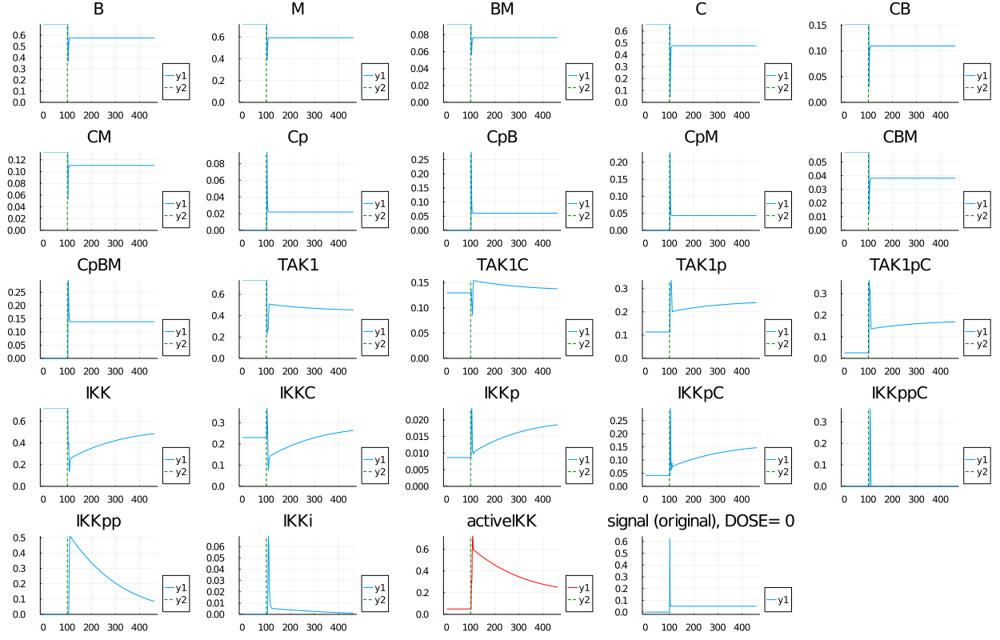

In [6]:
function plotallspecies(sol,tspan,phase1_sol)
    specie_names=["B","M","BM","C","CB","CM","Cp","CpB","CpM","CBM","CpBM","TAK1","TAK1C","TAK1p","TAK1pC","IKK","IKKC","IKKp","IKKpC","IKKppC","IKKpp","IKKi","activeIKK"];
    subplotlist=[]
    for j = 1:23
        yvalues=[]
        for h in range(9900,10000,step=1) #100 timepoints pre stimulus are taken
            b=phase1_sol(h)
            push!(yvalues,b[j])
        end
        # for i in range(0,length=Integer(tspan[2]))
        for i in range(0,tspan[2],step=1)
            local a=sol(i)
            push!(yvalues,a[j])
        end
         #make graph
        if j == 23
            Plots.plot(yvalues,title=specie_names[j],linecolor=:red)
        else
            Plots.plot(yvalues,title=specie_names[j],linecolor=:match)
        end
        vline!([100],line=(1,:dash,:green))
        ylims!((0,Inf))
        push!(subplotlist,current()) #most recent graph appended
    end
    return subplotlist
end
subplotlist=[]
subplotlist=plotallspecies(sol,tspan,phase1_sol)
titlez="signal (original), DOSE= "*string(DOSE)
push!(subplotlist, Plots.plot(collect(Iterators.flatten([zeros(100),map(x->originalsignal_nolate(x,xlate),range(1,360,step=1))])),title=titlez))
Plots.plot(subplotlist[1],subplotlist[2],subplotlist[3],subplotlist[4],subplotlist[5],subplotlist[6],subplotlist[7],subplotlist[8],subplotlist[9],subplotlist[10],subplotlist[11],subplotlist[12],subplotlist[13],subplotlist[14],subplotlist[15],subplotlist[16],subplotlist[17],subplotlist[18],subplotlist[19],subplotlist[20],subplotlist[21],subplotlist[22],subplotlist[23],subplotlist[24],size=[1250,800],legend=:outerbottomright,linewidth=1,show=true)

In [7]:
function plotactiveIKK(sol,tspan,phase1_sol)
    activeIKK=[]
    tf=tspan[2]
    for j=range(9900,10000,step=1)
        b=0
        a=phase1_sol(j)
        b=a[23]
        push!(activeIKK,b)
    end
    for j=0:tf
        b=0
        a=sol(j)
        b=a[23]
        push!(activeIKK,b)
    end
    return Plots.plot(activeIKK,title="activeIKK",color=:red,size=(50,50))
end
paramdetailednames=[" 1k basal C phosphorylation"," 2k basal CB phosphorylation"," 3k basal CM phosphorylation"," 4k basal CBM phosphorylation"," 5k signal dependent C phosphorylation"," 6k signal dependent CB phosphorylation"," 7k signal dependent CM phosphorylation"," 8k signal dependent CBM phosphorylation"," 9km signal dependent C phosphorylation","10km signal dependent CB phosphorylation","11km signal dependent CM phosphorylation signal","12km signal dependent CBM phosphorylation","13k Cp dephosphorylation","14k CpB dephosphorylation","15k CpM dephosphorylation","16k CpBM dephosphorylation","17km Cp dephosphorylation","18 ignore: unused parameter","19km CpB dephosporylation","20km Cpm dephosphorylation","21km CpBM dephosphorylation","22k B + M association","23k C + B association","24k C + M association","25k CB + M association","26k CM + B association","27k C + BM association","28k Cp + BM association","29k Cp + B association","30k Cp + M association","31k CpB + M association","32k CpM + B association","33k BM => B + M dissociation","34k CB => C + B dissociation","35k CM => C + M dissociation","36k CBM => CB + M  dissociation","37k CBM => CM + B dissociation","38k CpB => Cp + B dissociation","39k CpM => Cp + M dissociation","40k CpBM => CpB + M dissociation","41k CpBM => CpM + B dissociation","42k CBM => C + BM dissociation","43k CpBM => Cp + BM dissociation","44k basal TAK1 phosphorylation","45k Cp dependent TAK1 phosphorylation","46k CpB dependent TAK1 phosphorylation","47k CpM dependent TAK1 phosphorylation","48k CpBM dependent TAK1 phosphorylation","49km Cp dependent TAK1 phosphorylation","50km CpB dependent TAK1 phosphorylation","51km CpM dependent TAK1 phosphorylation","52km CpBM dependent TAK1 phosphorylation","53k IKKp dependent TAK1 phosphorylation","54km IKKp dependent TAK1 phosphorylation","55k basal TAK1 dephosphorylation","56km basal TAK1 dephosphorylation","57k basal TAK1C => TAK1pC phosphorylation","58k Cp dependent TAK1C => TAK1pC phosphorylation","59k CpB dependent TAK1C => TAK1pC phosphorylation","60k CpM dependent TAK1C => TAK1pC phosphorylation","61k CpBM dependent TAK1C => TAK1pC phosphorylation","62km Cp dependent TAK1C => TAK1pC phosphorylation","63km CpB dependent TAK1C => TAK1pC phosphorylation","64km CpM dependent TAK1C => TAK1pC phosphorylation","65km CpBM dependent TAK1C => TAK1pC phosphorylation","66k IKKp dependent TAK1C => TAK1pC phosphorylation","67km IKKp dependent TAK1C => TAK1pC phosphorylation","68k IKKpC dependent TAK1C => TAK1pC phosphorylation","69km IkkpC dependent TAK1C => TAK1pC phosphorylation","70k IKKppC dependent TAK1C => TAK1pC phosphorylation","71km IKKppC dependent TAK1C => TAK1pC phosphorylation","72k basal TAK1pC dephosphorylation","73km basal TAK1pC dephosphorylation","74k CB + TAK1 => TAK1C association","75k CM + TAK1 => TAK1C association","76k CBM + TAK1 => TAK1C association","77k CB + TAK1p => TAK1pC association","78k CM + TAK1p => TAK1pC association","79k CBM + TAK1p => TAK1pC association","80k CBM + TAK1C => TAK1 dissociation","81k CBM + TAK1pC => TAK1p dissociation","82k basal IKK => IKKp  phosphorylation","83k TAKp dependent IKK => IKKp phosphorylation","84km TAKp dependent IKK => IKKp phosphorylation","85k TAKpC dependent IKK => IKKp phosphorylation","86km TAKpC dependent IKK => IKKp phosphorylation","87k IKKp => IKK dephosphorylation","88km IKKp => IKK dephosphorylation","89k basal IKKC => IKKpC phosphorylation","90k TAKp dependent IKKC => IKKpC phosphorylation","91km TAKp dependent IKKC => IKKpC phosphorylation","92k TAKpC dependent IKKC => IKKpC phosphorylation","93km TAKpC dependent IKKC => IKKpC phosphorylation","94k IKKpC => IKKC dephosphorylation","95km IKKpC => IKKC dephosphorylation","96k CB + IKK => IKKC association","97k CM + IKK => IKKC association","98k CBM + IKK => IKKC association","99k CB + IKKp => IKKpC association","100k CM + IKKp => IKKpC association","101k CBM + IKKp => IKKpC association","102k IKKC => IKK dissociation between CBM and IKK","103k IKKpC  => IKKp dissociation between CBM + IKKp","104k basal IKKpC => IKKppC phosphorylation","105km basal IKKpC => IKKppC phosphorylation","106k IKKppC feedback induced IKKpC => IKKppC phosphorylation","107km IKKppC feedback induced IKKpC => IKKppC phosphorylation","108k IKKppC => IKKpC dephosphorylation","109km IKKppC => IKKpC dephosphorylation","110k IKKppC = > IKKpp dissociation between CBM and IKKpp","111k IKKpp => IKKiC inactivation","112km IKKppC => IKK inactivation","113k IKKpp => IKKi","114km IKKpp => IKKi inactivation","115k IKKi => IKK recycling","116kmIKKi => IKK recycling"]
function activeIKKmulti(sollist, param, modlist, tspan, mutant) #can accept any sol, interpolates for approximate values at t [0:end] defined by tspan above
    paramnames=paramdetailednames=[" 1k basal C phosphorylation"," 2k basal CB phosphorylation"," 3k basal CM phosphorylation"," 4k basal CBM phosphorylation"," 5k signal dependent C phosphorylation"," 6k signal dependent CB phosphorylation"," 7k signal dependent CM phosphorylation"," 8k signal dependent CBM phosphorylation"," 9km signal dependent C phosphorylation","10km signal dependent CB phosphorylation","11km signal dependent CM phosphorylation signal","12km signal dependent CBM phosphorylation","13k Cp dephosphorylation","14k CpB dephosphorylation","15k CpM dephosphorylation","16k CpBM dephosphorylation","17km Cp dephosphorylation","18 ignore: unused parameter","19km CpB dephosporylation","20km Cpm dephosphorylation","21km CpBM dephosphorylation","22k B + M association","23k C + B association","24k C + M association","25k CB + M association","26k CM + B association","27k C + BM association","28k Cp + BM association","29k Cp + B association","30k Cp + M association","31k CpB + M association","32k CpM + B association","33k BM => B + M dissociation","34k CB => C + B dissociation","35k CM => C + M dissociation","36k CBM => CB + M  dissociation","37k CBM => CM + B dissociation","38k CpB => Cp + B dissociation","39k CpM => Cp + M dissociation","40k CpBM => CpB + M dissociation","41k CpBM => CpM + B dissociation","42k CBM => C + BM dissociation","43k CpBM => Cp + BM dissociation","44k basal TAK1 phosphorylation","45k Cp dependent TAK1 phosphorylation","46k CpB dependent TAK1 phosphorylation","47k CpM dependent TAK1 phosphorylation","48k CpBM dependent TAK1 phosphorylation","49km Cp dependent TAK1 phosphorylation","50km CpB dependent TAK1 phosphorylation","51km CpM dependent TAK1 phosphorylation","52km CpBM dependent TAK1 phosphorylation","53k IKKp dependent TAK1 phosphorylation","54km IKKp dependent TAK1 phosphorylation","55k basal TAK1 dephosphorylation","56km basal TAK1 dephosphorylation","57k basal TAK1C => TAK1pC phosphorylation","58k Cp dependent TAK1C => TAK1pC phosphorylation","59k CpB dependent TAK1C => TAK1pC phosphorylation","60k CpM dependent TAK1C => TAK1pC phosphorylation","61k CpBM dependent TAK1C => TAK1pC phosphorylation","62km Cp dependent TAK1C => TAK1pC phosphorylation","63km CpB dependent TAK1C => TAK1pC phosphorylation","64km CpM dependent TAK1C => TAK1pC phosphorylation","65km CpBM dependent TAK1C => TAK1pC phosphorylation","66k IKKp dependent TAK1C => TAK1pC phosphorylation","67km IKKp dependent TAK1C => TAK1pC phosphorylation","68k IKKpC dependent TAK1C => TAK1pC phosphorylation","69km IkkpC dependent TAK1C => TAK1pC phosphorylation","70k IKKppC dependent TAK1C => TAK1pC phosphorylation","71km IKKppC dependent TAK1C => TAK1pC phosphorylation","72k basal TAK1pC dephosphorylation","73km basal TAK1pC dephosphorylation","74k CB + TAK1 => TAK1C association","75k CM + TAK1 => TAK1C association","76k CBM + TAK1 => TAK1C association","77k CB + TAK1p => TAK1pC association","78k CM + TAK1p => TAK1pC association","79k CBM + TAK1p => TAK1pC association","80k CBM + TAK1C => TAK1 dissociation","81k CBM + TAK1pC => TAK1p dissociation","82k basal IKK => IKKp  phosphorylation","83k TAKp dependent IKK => IKKp phosphorylation","84km TAKp dependent IKK => IKKp phosphorylation","85k TAKpC dependent IKK => IKKp phosphorylation","86km TAKpC dependent IKK => IKKp phosphorylation","87k IKKp => IKK dephosphorylation","88km IKKp => IKK dephosphorylation","89k basal IKKC => IKKpC phosphorylation","90k TAKp dependent IKKC => IKKpC phosphorylation","91km TAKp dependent IKKC => IKKpC phosphorylation","92k TAKpC dependent IKKC => IKKpC phosphorylation","93km TAKpC dependent IKKC => IKKpC phosphorylation","94k IKKpC => IKKC dephosphorylation","95km IKKpC => IKKC dephosphorylation","96k CB + IKK => IKKC association","97k CM + IKK => IKKC association","98k CBM + IKK => IKKC association","99k CB + IKKp => IKKpC association","100k CM + IKKp => IKKpC association","101k CBM + IKKp => IKKpC association","102k IKKC => IKK dissociation between CBM and IKK","103k IKKpC  => IKKp dissociation between CBM + IKKp","104k basal IKKpC => IKKppC phosphorylation","105km basal IKKpC => IKKppC phosphorylation","106k IKKppC feedback induced IKKpC => IKKppC phosphorylation","107km IKKppC feedback induced IKKpC => IKKppC phosphorylation","108k IKKppC => IKKpC dephosphorylation","109km IKKppC => IKKpC dephosphorylation","110k IKKppC = > IKKpp dissociation between CBM and IKKpp","111k IKKppC => IKKi inactivation","112km IKKppC => IKK inactivation","113k IKKpp => IKKi","114km IKKpp => IKKi inactivation","115k IKKi => IKK recycling","116kmIKKi => IKK recycling"]
    distancescores=[]
    z = string(paramdetailednames[Int(param)][3:end])#*" * "*string(modlist))
    yvalues=[]
    for itsol in range(1,length(sollist),step=2)
        itsol2=Int(itsol+1)
        d=plotactiveIKK(sollist[itsol2],tspan,sollist[itsol])
        e=d[1][1][:y]
        # distance=differencemetric(wildtype_DOSE_0!0_sol,sollist[itsol2],tspan,23)
        # ddistance=areaundercurve(sollist[itsol2],tspan,23)
        push!(yvalues,e)
        # # push!(distancescores,string(round(distance,digits=0))*string(round(ddistance,digits=0)))
        # push!(distancescores,[round(distance,digits=0),round(ddistance,digits=0)])
    end
    if param in [23,26,29,32,34,38,37,41,45,46,47,48,49,50,51,52,58,59,60,61,62,63,64,65] && mutant == true
        titlefontcolor=:red
    else
        titlefontcolor=:black
    end
    return Plots.plot(range(0,(tspan[2]+101),step=1),yvalues,ylabel="active IKK",xlabel="t",title=z,show=true,label=adjoint(distancescores),legend=:bottomleft,titlefont=titlefontcolor)
end

activeIKKmulti (generic function with 1 method)

In [8]:
function areaundercurve(inputsol,tspan,specie) #stupidly simple just adds each value
    score=0
    for i in range(tspan[1],tspan[2],step=1)
        b=inputsol(i)
        score=score+b[specie]
    end
return score
end
function differencemetric(targetsol,inputsol,tspan,specie)
    score=0.0
    squarescore=0.0
    for i in range(tspan[1],tspan[2],step=1)
        a=targetsol(i)
        b=inputsol(i)
        squarescore=squarescore+=(((a[specie]-b[specie])^2)^(1/2))
        score=score+(a[specie]-b[specie])
    end
return score
end

differencemetric (generic function with 1 method)

In [9]:
function card11mut(MUTATIONMODS,mods_tbd)
    #Would lke to model mutations F123I and L225LI in the CARD11 domain.
    #Activating mutations!!
    #default mods_tbd=[2,0.5,2,0.5,2,0.5,2,0.5,2,0.5,2,0.5,2,0.5,2,0.5,2,2,2,2,0.5,0.5,0.5,0.5]
    #wildtype mods_tbd=ones(23)
    #Cp dependent TAK1 phosphorylation, flux36
    MUTATIONMODS[45]=MUTATIONMODS[45]*mods_tbd[1] #kCTpS
    MUTATIONMODS[49]=MUTATIONMODS[49]*mods_tbd[2] #kmCTpS
    #CpM, flux37
    MUTATIONMODS[46]=MUTATIONMODS[46]*mods_tbd[3] #kCBTpS
    MUTATIONMODS[50]=MUTATIONMODS[50]*mods_tbd[4] #kmCBTpS
    #CpB, flux38
    MUTATIONMODS[47]=MUTATIONMODS[47]*mods_tbd[5] #kCMTpS
    MUTATIONMODS[51]=MUTATIONMODS[51]*mods_tbd[6] #kmCMTpS
    #CpBM, flux39
    MUTATIONMODS[48]=MUTATIONMODS[48]*mods_tbd[7] #kCBMTpS
    MUTATIONMODS[52]=MUTATIONMODS[52]*mods_tbd[8] #kmCBMTpS
    ##
    #Cp dependent TAK1C phosphorylation, flux43
    MUTATIONMODS[58]=MUTATIONMODS[58]*mods_tbd[9] #kCTpCS
    MUTATIONMODS[62]=MUTATIONMODS[62]*mods_tbd[10] #kmCPTpCS
    #CpM dependent TAK1C phosphorylation, flux44
    MUTATIONMODS[59]=MUTATIONMODS[59]*mods_tbd[11] #kCBTpCS
    MUTATIONMODS[63]=MUTATIONMODS[63]*mods_tbd[12] #kmCBTpCS
    #CpB dependent TAK1C phosphorylation, flux45
    MUTATIONMODS[60]=MUTATIONMODS[60]*mods_tbd[13] #kCMTpCS
    MUTATIONMODS[64]=MUTATIONMODS[64]*mods_tbd[14] #kmCMTpCS
    #CpBM dependent TAK1C phosphorylation, flux46
    MUTATIONMODS[61]=MUTATIONMODS[61]*mods_tbd[15] #kCBMTpCS
    MUTATIONMODS[65]=MUTATIONMODS[65]*mods_tbd[16] #kmCBMTpCS
    ##
    #CARD11 activating mutations (F123I, L225LI) in the LATCH domain increase affinity for BCL10
    #Cp association to BCL10, flux17
    MUTATIONMODS[29]=MUTATIONMODS[29]*mods_tbd[17] #kCpaB
    #C association to B, flux15
    MUTATIONMODS[23]=MUTATIONMODS[23]*mods_tbd[18] #kCaB
    #CM association to B, flux27
    MUTATIONMODS[26]=MUTATIONMODS[26]*mods_tbd[19] #kCMaB
    #CpM association to B, flux29
    MUTATIONMODS[32]=MUTATIONMODS[32]*mods_tbd[20] #kCpMaB
    ##decreasing dissociation between Bcl10 and Card11mut (may not be needed)
    #CpB dissociation  flux18
    MUTATIONMODS[38]=MUTATIONMODS[38]*mods_tbd[21] #kCpdB
    #CB dissociation flux16
    MUTATIONMODS[34]=MUTATIONMODS[34]*mods_tbd[22] #kCdB
    #CBM dissociation flux28
    MUTATIONMODS[37]=MUTATIONMODS[37]*mods_tbd[23] #kCMdB
    #CpBM dissociation flux30
    MUTATIONMODS[41]=MUTATIONMODS[41]*mods_tbd[24] #kCpMdB
    #                                 check mods tbd column
    return MUTATIONMODS
end

card11mut (generic function with 1 method)

The CARD11 mutant is simulated by adjusting the global MUTATIONMODS using the function card11mut(MUTATIONMODS,mods_tbd). This changes all 24 parameters I decided to include in the mutant. mods_tbd may be changed to make the mutant more or less potent.

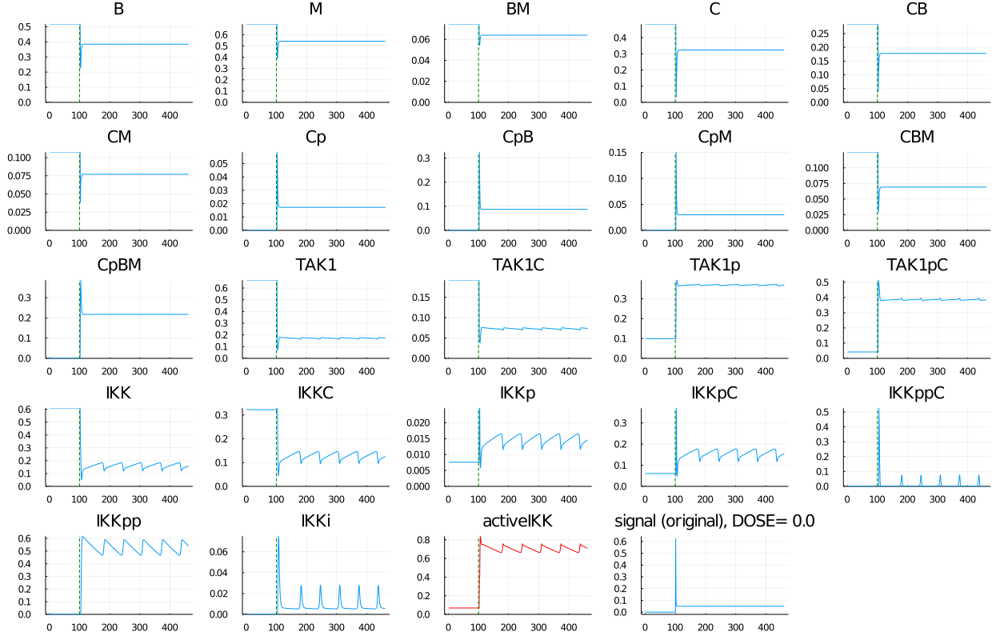

In [10]:
mods_tbd=[2,0.5,2,0.5,2,0.5,2,0.5,2,0.5,2,0.5,2,0.5,2,0.5,2,2,2,2,0.5,0.5,0.5,0.5]
global MUTATIONMODS=card11mut(MUTATIONMODS,mods_tbd)
global PHASE=1
phase1_tspan=[0.0,10000.0]
prob_phase1_inoue=ODEProblem(inoue2016,u0,phase1_tspan,zeros(7))
phase1_sol=solve(prob_phase1_inoue)
u0_endofphase1=float(phase1_sol[end])
#Run problem.
global PHASE=2
global DOSE=0.0
tspan=[0.0,360.0]
adsrparams=[false]
prob_inoue=ODEProblem(inoue2016,u0_endofphase1,tspan,adsrparams)
sol=solve(prob_inoue)
fullmutant_DOSE_0!0_sol=sol
subplotlist=plotallspecies(sol,tspan,phase1_sol)
titlez="signal (original), DOSE= "*string(DOSE)
push!(subplotlist, Plots.plot(collect(Iterators.flatten([zeros(100),map(x->originalsignal_nolate(x,xlate),range(1,360,step=1))])),title=titlez))
display(Plots.plot(subplotlist[1],subplotlist[2],subplotlist[3],subplotlist[4],subplotlist[5],subplotlist[6],subplotlist[7],subplotlist[8],subplotlist[9],subplotlist[10],subplotlist[11],subplotlist[12],subplotlist[13],subplotlist[14],subplotlist[15],subplotlist[16],subplotlist[17],subplotlist[18],subplotlist[19],subplotlist[20],subplotlist[21],subplotlist[22],subplotlist[23],subplotlist[24],size=[1250,800],legend=:none,linewidth=1,show=true))

Above created a CARD11 mutant trajectory, responding to full stimulation (which rapidly decays.)
We save this output to fullmutant_DOSE_0!0_sol to use later for difference calculating.

Now we can generate a parameter sensitivity analysis of the wildtype or the CARD11 mutant, to give us an idea of which parameters have a greater influence on the activeIKK output. (This is a long job.) Afterwards, we can do the same for the wildtype. Notice we could switch between the two if we uncomment line 15 instead of 14.

In [11]:
modlist=[0.1,0.5,1,2,10]
params=[false,0,0,0,0,0,0]
global DOSE =0.0
subplotlist=[]

sollsperparameter=[]
squaredrooteddiflist_wt=[]
squaredrooteddiflist_mut=[]
totalactiveIKKlist=[]
for range in [1:116]
# for range in [23,26,29,32,34,37,38,41,45,46,47,48,49,50,51,52,58,59,60,61,62,63,64,65] #CARD11 mutant params only.
    for i in range  #range of i corresponds to range of parameters to test, 116 total
        local sollist=[]
        global MUTATIONMODS=card11mut(ones(116),[2,0.5,2,0.5,2,0.5,2,0.5,2,0.5,2,0.5,2,0.5,2,0.5,2,2,2,2,0.5,0.5,0.5,0.5])
#         global MUTATIONMODS=ones(116) ########uncomment this to simulate the wildtype#########
        if MUTATIONMODS==ones(116)
            mutantflag=false
        else
            mutantflag=true
        end
        for j in modlist #will cycle through modifiers
            #Defining and solving problem
            global MUTATIONMODS[i]=j
            println(i,"mod",j) #for debugging
            global PHASE = 1
            local prob_phase1_inoue = ODEProblem(inoue2016,u0,phase1_tspan,zeros(7)) #define problem for altered parameter
            local phase1_sol=solve(prob_phase1_inoue) #make sol solution object for the modifier*parameter combo
            local u0_endofphase1=float(phase1_sol[end])
            global PHASE = 2
            local prob_inoue=ODEProblem(inoue2016,u0_endofphase1,tspan,params)
            local sol=solve(prob_inoue)
            d=differencemetric(wildtype_DOSE_0!0_sol,sol,tspan,23)
            dd=areaundercurve(sol,tspan,23)
            ddd=differencemetric(fullmutant_DOSE_0!0_sol,sol,tspan,23)
            push!(squaredrooteddiflist_wt,d)
            push!(squaredrooteddiflist_mut,ddd)
            push!(totalactiveIKKlist,dd)
            # println("squaredifference from wt activeIKK: (not SSt8 normalised): ",d)
            # println("activeIKK score: ",dd)
            # println("dif from full mutant: ",ddd)
            push!(sollist,phase1_sol)
            push!(sollist,sol) #gather solution objects for that parameter (all modifiers)
        end
        push!(sollsperparameter,sollist)
        #make a plot for that parameter and all its modifiers
        push!(subplotlist,activeIKKmulti(sollist, i, modlist, tspan,mutantflag)) #gather those plots, subplotlist contains all parameters' plots
    end
end

1mod0.1
1mod0.5
1mod1.0
1mod2.0
1mod10.0
2mod0.1
2mod0.5
2mod1.0
2mod2.0
2mod10.0
3mod0.1
3mod0.5
3mod1.0
3mod2.0
3mod10.0
4mod0.1
4mod0.5
4mod1.0
4mod2.0
4mod10.0
5mod0.1
5mod0.5
5mod1.0
5mod2.0
5mod10.0
6mod0.1
6mod0.5
6mod1.0
6mod2.0
6mod10.0
7mod0.1
7mod0.5
7mod1.0
7mod2.0
7mod10.0
8mod0.1
8mod0.5
8mod1.0
8mod2.0
8mod10.0
9mod0.1
9mod0.5
9mod1.0
9mod2.0
9mod10.0
10mod0.1
10mod0.5
10mod1.0
10mod2.0
10mod10.0
11mod0.1
11mod0.5
11mod1.0
11mod2.0
11mod10.0
12mod0.1
12mod0.5
12mod1.0
12mod2.0
12mod10.0
13mod0.1
13mod0.5
13mod1.0
13mod2.0
13mod10.0
14mod0.1
14mod0.5
14mod1.0
14mod2.0
14mod10.0
15mod0.1
15mod0.5
15mod1.0
15mod2.0
15mod10.0
16mod0.1
16mod0.5
16mod1.0
16mod2.0
16mod10.0
17mod0.1
17mod0.5
17mod1.0
17mod2.0
17mod10.0
18mod0.1
18mod0.5
18mod1.0
18mod2.0
18mod10.0
19mod0.1
19mod0.5
19mod1.0
19mod2.0
19mod10.0
20mod0.1
20mod0.5
20mod1.0
20mod2.0
20mod10.0
21mod0.1
21mod0.5
21mod1.0
21mod2.0
21mod10.0
22mod0.1
22mod0.5
22mod1.0
22mod2.0
22mod10.0
23mod0.1
23mod0.5
23mod1.0
23mod2

In [12]:
push!(subplotlist, Plots.plot(collect(Iterators.flatten([zeros(100),map(x->originalsignal_nolate(x,xlate),range(1,360,step=1))])),title=titlez))
Plots.plot(subplotlist[1],subplotlist[2],subplotlist[3],subplotlist[4],subplotlist[5],subplotlist[6],subplotlist[7],subplotlist[8],subplotlist[9],subplotlist[10],subplotlist[11],subplotlist[12],subplotlist[13],subplotlist[14],subplotlist[15],subplotlist[16],subplotlist[17],subplotlist[18],subplotlist[19],subplotlist[20],subplotlist[21],subplotlist[22],subplotlist[23],subplotlist[24],subplotlist[25],subplotlist[26],subplotlist[27],subplotlist[28],subplotlist[29],subplotlist[30],subplotlist[31],subplotlist[32],subplotlist[33],subplotlist[34],subplotlist[35],subplotlist[36],subplotlist[37],subplotlist[38],subplotlist[39],subplotlist[40],subplotlist[41],subplotlist[42],subplotlist[43],subplotlist[44],subplotlist[45],subplotlist[46],subplotlist[47],subplotlist[48],subplotlist[49],subplotlist[50],subplotlist[51],subplotlist[52],subplotlist[53],subplotlist[54],subplotlist[55],subplotlist[56],subplotlist[57],subplotlist[58],subplotlist[59],subplotlist[60],subplotlist[61],subplotlist[62],subplotlist[63],subplotlist[64],subplotlist[65],subplotlist[66],subplotlist[67],subplotlist[68],subplotlist[69],subplotlist[70],subplotlist[71],subplotlist[72],subplotlist[73],subplotlist[74],subplotlist[75],subplotlist[76],subplotlist[77],subplotlist[78],subplotlist[79],subplotlist[80],subplotlist[81],subplotlist[82],subplotlist[83],subplotlist[84],subplotlist[85],subplotlist[86],subplotlist[87],subplotlist[88],subplotlist[89],subplotlist[90],subplotlist[91],subplotlist[92],subplotlist[93],subplotlist[94],subplotlist[5],subplotlist[96],subplotlist[97],subplotlist[98],subplotlist[99],subplotlist[100],subplotlist[101],subplotlist[102],subplotlist[103],subplotlist[104],subplotlist[105],subplotlist[106],subplotlist[107],subplotlist[108],subplotlist[109],subplotlist[110],subplotlist[111],subplotlist[112],subplotlist[113],subplotlist[114],subplotlist[115],subplotlist[116],subplotlist[117],linewidth=2,legend=:none,titlefont=7,xguidefontsize=6,yguidefontsize=6,ylabel=(""),size=(3000,2000))

It's useful to do this for the mutant because PERTURBING these parameters during the sensitivity analysis shows how effective a drug targetting that parameter may be on the whole mutant system. Since a high IKK activity; and therefore high NFkB activity downstream gives a poorer prognosis, we should aim to reduce the active IKK.

Using the distance calculations we took during the sensitivity analysis; we can see how far the perturbed parameter pushes the system from the mutant or wt systems.

In [13]:
# parameter bar chart(s):

In [14]:
function sortandorder(list1,list2) #sorts list1 and returns: list1highest[highestid1],list2[highestid1],highestid1, then 2ndhighest... in a 3 by n matrix.
    if length(list1)!=length(list2)
        throw("lists are not same length")
    end
    mat = reshape([],0,3)
    orderlist=collect(1:length(list1))
    compositelist=[]
    for n in orderlist
        push!(compositelist,[[list1[n]],[list2[n]],[n]])
    end
    #to find out the mod do modlist[(queryID%5)+1]
    sorted=sort(compositelist,rev=true)
    for n in range(1,length(sorted),step=1)
        x=[sorted[n][1] sorted[n][2] sorted[n][3]]
        mat= vcat(mat,x)
    end
    return mat
end
composite=sortandorder(squaredrooteddiflist_mut,totalactiveIKKlist);

In [15]:
p1=Plots.bar(composite[:,1],title="Distance from Mutant")
p2=Plots.bar(composite[:,2],title="active IKK",legend=:bottomright)
Plots.plot(p1,p2,layout=(2,1),size=(750,1000));
#remove semicolon to see every param crossed with every modifier unordered. Big central flat area is wildtype trajectories, and insensitive params with very little effect.

In [4]:
phosphorylation=float([1 2 3 4 5 6 7 8 9 10 11 12 44 45 46 47 48 49 50 51 52 53 54 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 82 83 84 85 86 89 90 91 92 93 104 105 106 107])
association=float([22 23 24 25 26 27 28 29 30 31 32 74 75 76 77 78 79 96 97 98 99 100 101])
dissociation=float([33 34 35 36 37 38 39 40 41 42 43 80 81 102 103 110])
dephosphorylation=float([13 14 15 16 17 19 20 21 55 56 72 73 87 88 94 95 108 109])
other=float([116 115 114 113 112 111]);

In [6]:
length(phosphorylation)

52

In [141]:
size(composite)
for i in range(470,477,step=1)
    param=round(composite[i,3]/5,RoundUp)
    remainder=composite[i,3]%5
    println(i, "     comp:",composite[i,3], "    rem:", remainder,  "    param:", param)
end

470     comp:52.0    rem:2.0    param:11.0
471     comp:265.0    rem:0.0    param:53.0
472     comp:280.0    rem:0.0    param:56.0
473     comp:145.0    rem:0.0    param:29.0
474     comp:271.0    rem:1.0    param:55.0
475     comp:401.0    rem:1.0    param:81.0
476     comp:34.0    rem:4.0    param:7.0
477     comp:499.0    rem:4.0    param:100.0


In [143]:
function extractgroup(composite,group,mod)
    #mod input maps to modlist thusly: 0,1,2,3,4 => 10, 0.1, 0.5, 1, 2
    list=[ ]
    labellist=[ ]
    i=size(composite)[1]
    for n in range(1,i,step=1)
    r=round(composite[n,3]/5,RoundUp)
    remainder=composite[n,3]%5
    if r in group && remainder==mod #select the mod we want
        push!(list,composite[n])
        axislabel=string(paramdetailednames[Int(r)])[1:3]
        push!(labellist,strip(axislabel,'k'))
    end
    end
#     if r < 1.0
#         println("invalid id located, r= ", r)
#     end
    return list, labellist
end

extractgroup (generic function with 1 method)

In [128]:
extractgroup(composite,phosphorylation,1)

(Any[127.33332775188295, 65.78045351519309, 33.345936147072756, 26.50503936195177, 24.33993533737695, 23.92915657702524, 14.658726779060146, 14.236184622974797, 13.146168660433458, 5.86906649815077  …  -12.016484427427264, -12.221565176044187, -13.473306013068632, -14.935841886390278, -15.983640548077544, -47.88802068635169, -53.24479710333408, -63.98648029846189, -69.99678018737845, -91.72878361139196], Any["106", "85", "83", " 6", "92", "61", "90", "59", " 5", "68"  …  "11", "63", " 9", "65", "10", "84", "91", "93", "86", "107"])

In [109]:
for i=range(1,length(label15),step=1)
println(data15[i],"asdf   ", data3[i])
end

229.44859746001026asdf   228.19691144135336
208.21558953508082asdf   195.93700603509106
196.96174826726653asdf   127.3351637071007
127.33516369640064asdf   106.05237046504341
55.65626277860879asdf   26.417297069283613
38.431316388004376asdf   11.806371530049613
11.9007255120949asdf   8.4367319915504
10.285454933180308asdf   8.218985809660094
8.93231774943422asdf   6.441169687359758
-1.3905079630649493asdf   1.5718729301565721
-3.193260004218106asdf   0.14110047885410332
-4.009569188038429asdf   0.0
-13.151397692464815asdf   -1.618067542939019
-13.874393314179265asdf   -1.7920861645290758
-22.569216370591445asdf   -4.046379540767488
-46.06215058630801asdf   -13.362276721416393
-75.81347099100981asdf   -13.721021583535748
-85.34512494099198asdf   -14.100937220026575


In [185]:
data1,label1=extractgroup(composite,association,1)
data2,label2=extractgroup(composite,phosphorylation,1)
data3,label3=extractgroup(composite,dephosphorylation,1)
data4,label4=extractgroup(composite,dissociation,1)
data5,label5=extractgroup(composite,association,2)
data6,label6=extractgroup(composite,phosphorylation,2)
data7,label7=extractgroup(composite,dephosphorylation,2)
data8,label8=extractgroup(composite,dissociation,2)
data9,label9=extractgroup(composite,association,4)
data10,label10=extractgroup(composite,phosphorylation,4)
data11,label11=extractgroup(composite,dephosphorylation,4)
data12,label12=extractgroup(composite,dissociation,4)
data13,label13=extractgroup(composite,association,0)
data14,label14=extractgroup(composite,phosphorylation,0)
data15,label15=extractgroup(composite,dephosphorylation,0)
data16,label16=extractgroup(composite,dissociation,0)
data17,label17=extractgroup(composite,other,1)
data18,label18=extractgroup(composite,other,2)
data19,label19=extractgroup(composite,other,4)
data20,label20=extractgroup(composite,other,0)

p1=Plots.bar(label1,data1,title="association params, mod=0.1, mutant diff")
p2=Plots.bar(label2,data2,xrotation=90,title="phosphorylation")
p3=Plots.bar(label3,data3,title="dephosphorylation")
p4=Plots.bar(label4,data4,title="dissociation")

p5=Plots.bar(label5,data5,title="association params, mod=0.5")
p6=Plots.bar(label6,data6,xrotation=90,title="phosphorylation")
p7=Plots.bar(label7,data7,title="dephosphorylation")
p8=Plots.bar(label8,data8,title="dissociation")

p9=Plots.bar(label9,data9,title="association params, mod=2")
p10=Plots.bar(label10,data10,xrotation=90,title="phosphorylation")
p11=Plots.bar(label11,data11,title="dephosphorylation")
p12=Plots.bar(label12,data12,title="dissociation")

p13=Plots.bar(label13,data13,title="association params, mod=10")
p14=Plots.bar(label14,data14,xrotation=90,title="phosphorylation")
p15=Plots.bar(label15,data15,title="dephosphorylation")
p16=Plots.bar(label16,data16,title="dissociation")

p17=Plots.bar(label17,data17,title="other")
p18=Plots.bar(label18,data18,title="other")
p19=Plots.bar(label19,data19,title="other")
p20=Plots.bar(label20,data20,title="other")

#alt layout
println("Mutant Difference Scores of perturbed parameter mutant systems, arranged in parameter subgroup rows, and parameter modifier columns.")
# Plots.plot(p1,p2,p3,p4,p17,p5,p6,p7,p8,p18,p9,p10,p11,p12,p19,p13,p14,p15,p16,p20,layout=(4,5),legend=:none,size=(2000,1000),xtickfont=font(6),xticks=maximum(52))
# Plots.plot(p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11,p12,p13,p14,p15,p16,layout=(4,4),legend=:none,size=(2000,1000),xtickfont=font(6),xticks=maximum(52))#ignore others
# Plots.plot(p1,p5,p9,p13,p2,p6,p10,p14,p3,p7,p11,p15,p4,p8,p12,p16,layout=(4,4),legend=:none,size=(2000,1000),xtickfont=font(6),xticks=maximum(52));
Plots.plot(p1,p5,p9,p13,p2,p6,p10,p14,p3,p7,p11,p15,p4,p8,p12,p16,p17,p18,p19,p20,layout=(5,4),legend=:none,size=(2000,1400),xtickfont=font(6),xticks=maximum(52))
current()

Mutant Difference Scores of perturbed parameter mutant systems, arranged in parameter subgroup rows, and parameter modifier columns.


In [154]:
println("Params don't follow perfectly linearly, e.g. dephosphorylation top three are a different order between 0.2 and 0.1 mods.")
println(paramdetailednames[108])
println(paramdetailednames[94])

Params don't follow perfectly linearly, e.g. dephosphorylation top three are a different order between 0.2 and 0.1 mods.
108k IKKppC => IKKpC dephosphorylation
94k IKKpC => IKKC dephosphorylation


In [186]:
Plots.savefig("mutant_diff_altogethernow")

mod 0.1


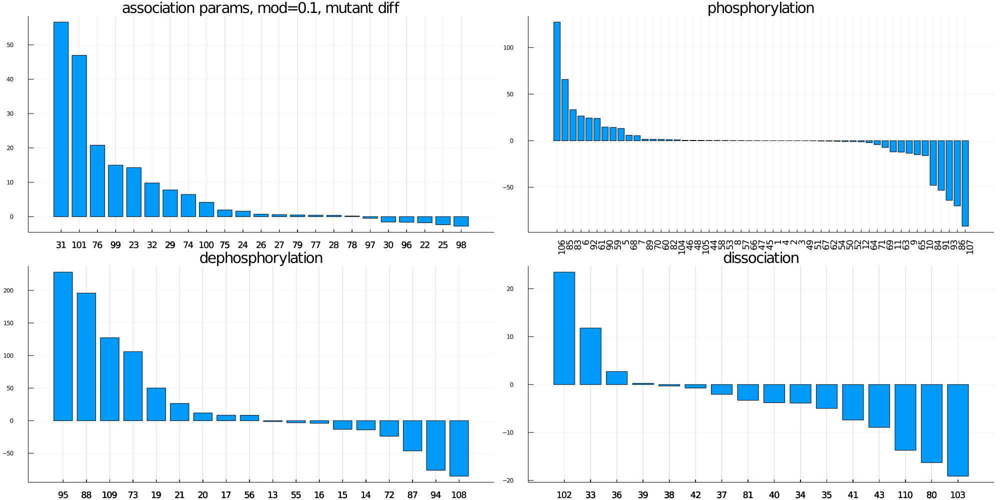

In [164]:
println("mod 0.1")
Plots.plot(p1,p2,p3,p4,layout=(2,2),legend=:none,size=(2000,1000),xtickfont=font(12),titlefont=20,xticks=maximum(52))

mod 0.5


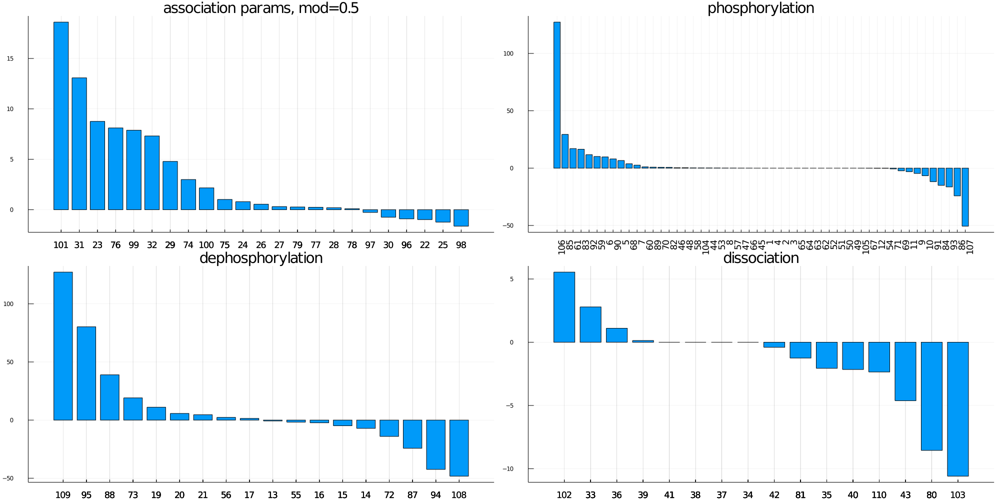

In [162]:
println("mod 0.5")
Plots.plot(p5,p6,p7,p8,layout=(2,2),legend=:none,size=(2000,1000),xtickfont=font(12),titlefont=20,xticks=maximum(52))

mod 2


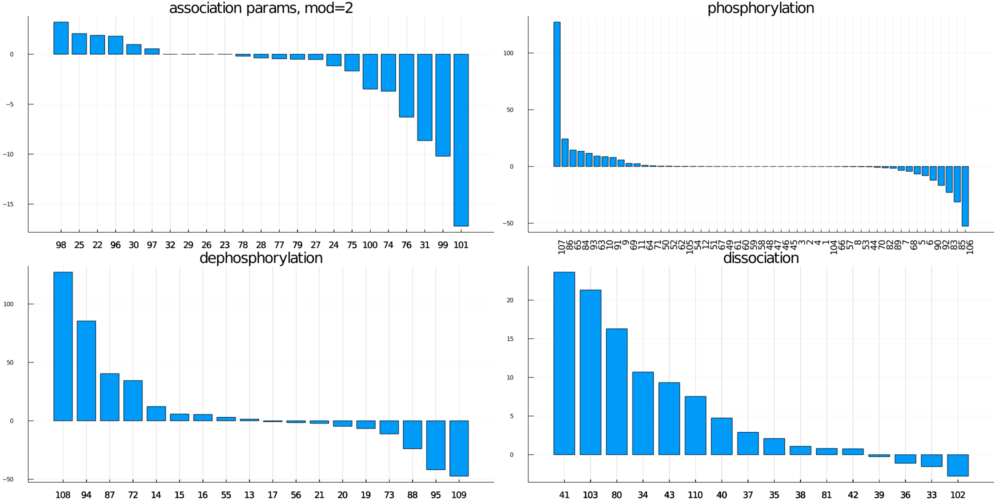

In [160]:
println("mod 2")
Plots.plot(p9,p10,p11,p12,layout=(2,2),legend=:none,size=(2000,1000),xtickfont=font(12),titlefont=20,xticks=maximum(52))

mod 10


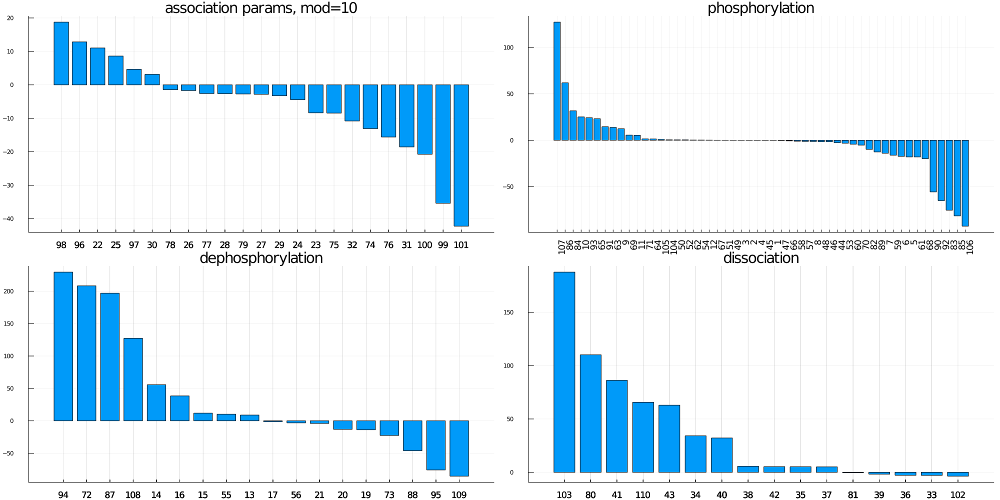

In [158]:
println("mod 10")
Plots.plot(p13,p14,p15,p16,layout=(2,2),legend=:none,size=(2000,1000),xtickfont=font(12),titlefont=20,xticks=maximum(52))

In [ ]:
#attempt to get totalactiveIKKlist 
function extractIKKgroup(composite,group,mod)
    #mod input maps to modlist thusly: 0,1,2,3,4 => 10, 0.1, 0.2, 1, 2
    list=[ ]
    labellist=[ ]
    i=size(composite)[1]
    for n in range(1,i,step=1)
    r=round(composite[n,3]/5,RoundDown)
    remainder=composite[n,3]%5 #modlist[remainder] is the modifier
    if r in group && remainder==mod #select the mod we want
        push!(list,composite[n,2])
        push!(labellist,strip(string(paramdetailednames[Int(r)])[1:3],'k'))
    end
    end
    return list, labellist
end

Same results using activeIKK as the score


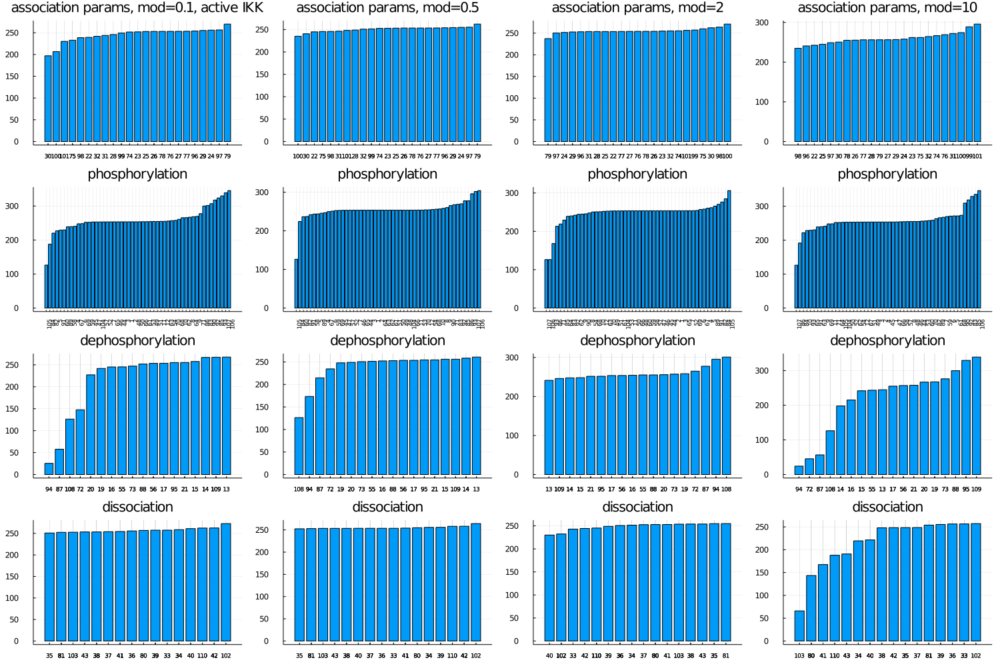

In [112]:
data1,label1=extractIKKgroup(composite,association,1)
data2,label2=extractIKKgroup(composite,phosphorylation,1)
data3,label3=extractIKKgroup(composite,dephosphorylation,1)
data4,label4=extractIKKgroup(composite,dissociation,1)
data5,label5=extractIKKgroup(composite,association,2)
data6,label6=extractIKKgroup(composite,phosphorylation,2)
data7,label7=extractIKKgroup(composite,dephosphorylation,2)
data8,label8=extractIKKgroup(composite,dissociation,2)
data9,label9=extractIKKgroup(composite,association,4)
data10,label10=extractIKKgroup(composite,phosphorylation,4)
data11,label11=extractIKKgroup(composite,dephosphorylation,4)
data12,label12=extractIKKgroup(composite,dissociation,4)
data13,label13=extractIKKgroup(composite,association,0)
data14,label14=extractIKKgroup(composite,phosphorylation,0)
data15,label15=extractIKKgroup(composite,dephosphorylation,0)
data16,label16=extractIKKgroup(composite,dissociation,0)

p1=Plots.bar(label1,data1,title="association params, mod=0.1, active IKK")
p2=Plots.bar(label2,data2,xrotation=90,title="phosphorylation")
p3=Plots.bar(label3,data3,title="dephosphorylation")
p4=Plots.bar(label4,data4,title="dissociation")

p5=Plots.bar(label5,data5,title="association params, mod=0.5")
p6=Plots.bar(label6,data6,xrotation=90,title="phosphorylation")
p7=Plots.bar(label7,data7,title="dephosphorylation")
p8=Plots.bar(label8,data8,title="dissociation")

p9=Plots.bar(label9,data9,title="association params, mod=2")
p10=Plots.bar(label10,data10,xrotation=90,title="phosphorylation")
p11=Plots.bar(label11,data11,title="dephosphorylation")
p12=Plots.bar(label12,data12,title="dissociation")

p13=Plots.bar(label13,data13,title="association params, mod=10")
p14=Plots.bar(label14,data14,xrotation=90,title="phosphorylation")
p15=Plots.bar(label15,data15,title="dephosphorylation")
p16=Plots.bar(label16,data16,title="dissociation")

Plots.plot(p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11,p12,p13,p14,p15,p16,layout=(4,4),legend=:none,size=(1500,1000))
#alt layout
println("Same results using activeIKK as the score")
Plots.plot(p1,p5,p9,p13,p2,p6,p10,p14,p3,p7,p11,p15,p4,p8,p12,p16,layout=(4,4),legend=:none,size=(1500,1000),xtickfont=font(6),xticks=maximum(52))

In [117]:
3.0 in composite

true

In [151]:
function spiderdiagram(parameter, diflist)#needs squaredrooteddiflist_wt or _mut
    titlez=paramdetailednames[parameter]
    id=parameter*5
    data=[]
    for n in range(0,4,step=1)
        push!(data,diflist[id-n])
    end
    return Plots.bar(["0.1","0.5","1","2","10"],reverse(data),legend=:none,title=titlez,ylabel="perturbed param system difference from original",size=(500,400))
end

spiderdiagram (generic function with 1 method)

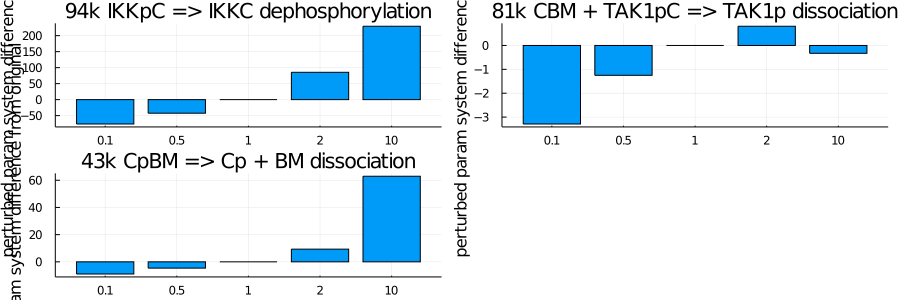

In [152]:
p1=spiderdiagram(94,squaredrooteddiflist_mut)
p2=spiderdiagram(81,squaredrooteddiflist_mut)
p3=spiderdiagram(43,squaredrooteddiflist_mut)
Plots.plot(p1,p2,p3,size=(900,300))

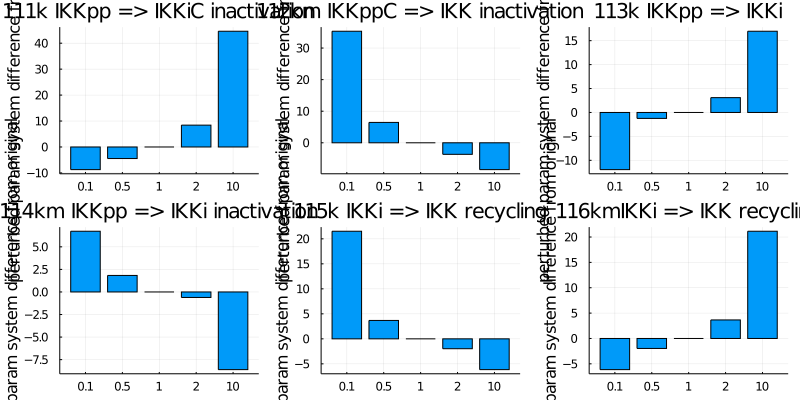

In [173]:
p1=spiderdiagram(111,squaredrooteddiflist_mut)
p2=spiderdiagram(112,squaredrooteddiflist_mut)
p3=spiderdiagram(113,squaredrooteddiflist_mut)
p4=spiderdiagram(114,squaredrooteddiflist_mut)
p5=spiderdiagram(115,squaredrooteddiflist_mut)
p6=spiderdiagram(116,squaredrooteddiflist_mut)
Plots.plot(p1,p2,p3,p4,p5,p6,size=(800,400))

In [33]:
sortandorder(squaredrooteddiflist_mut,totalactiveIKKlist)

580×3 Array{Any,2}:
 229.449    24.2035  470.0
 228.197    25.4551  471.0
 208.216    45.4365  360.0
 196.962    56.6903  435.0
 195.937    57.7151  436.0
 187.625    66.0267  515.0
 127.335   126.317   541.0
 127.335   126.317   540.0
 127.333   126.319   526.0
 127.333   126.319   535.0
 127.318   126.334   527.0
 127.315   126.337   539.0
 127.315   126.337   542.0
   ⋮                 
 -55.6813  309.333   450.0
 -63.9865  317.639   461.0
 -65.0544  318.706   460.0
 -69.9968  323.649   426.0
 -75.3571  329.009   415.0
 -75.8135  329.466   475.0
 -76.2045  329.857   466.0
 -81.523   335.175   425.0
 -85.2304  338.882   536.0
 -85.3451  338.997   545.0
 -91.7288  345.381   531.0
 -92.5667  346.219   530.0